# Option Chain Data Analysis

## ***!pip install xgboost plotly pandas numpy scikit-learn seaborn***

> If importing the libraries gives you error ****no 'library_name'.module found****. Then run the above command to install the libraries in your python envirionment


## Importing all the required libraries

In [1]:
import pandas as pd
import numpy as np
import plotly.figure_factory as ff
import plotly.express as px
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import xgboost as xg
from sklearn.metrics import mean_squared_error as MSE
import warnings
warnings.filterwarnings("ignore")

**DATA EXTRACTION**

#### Some of the data identified as input for the analysis may arrive in a format incompatible with the Big Data solution.But in this case,dataset is already available and no transformation is required.
* The data is in CSV format
* It contains the Option Chain data for SPY Index, from July 1 2021 to July 30 2021. 
* It includes 22 Column and 221,046 rows which we process further to get useful information and will remove some columns if required


In [2]:
# Here we are using python's dataframe library Pandas to read the giver CSV file to perform oprations
# pd.read_csv function is used to read it where pd is pandas library and read_csv is function
df = pd.read_csv('/kaggle/input/big-data-activity2/data_download 1Jul2021_to_30Jul2021.csv')

In [3]:
# using .head() function to display the first 5 rows of the dataset on our dataframe variable 'df'
df.head()

,symbol,exchange,date,adjusted close,option symbol,expiration,strike,call/put,style,ask,...,iv,volume,open interest,stock price for iv,*,delta,vega,gamma,theta,rho
0,SPY,NYSEArca,07/30/2021,438.51,SPY 210730C00215000,07/30/2021,215.0,C,A,224.56,...,-1.0,0,0,438.97,NaN,0.0,0.0,0.0,0.0,0.0
1,SPY,NYSEArca,07/30/2021,438.51,SPY 210730P00215000,07/30/2021,215.0,P,A,0.01,...,-1.0,0,1401,438.97,NaN,0.0,0.0,0.0,0.0,0.0
2,SPY,NYSEArca,07/30/2021,438.51,SPY 210730C00220000,07/30/2021,220.0,C,A,219.56,...,-1.0,0,1,438.97,NaN,0.0,0.0,0.0,0.0,0.0
3,SPY,NYSEArca,07/30/2021,438.51,SPY 210730P00220000,07/30/2021,220.0,P,A,0.01,...,-1.0,50,328,438.97,NaN,0.0,0.0,0.0,0.0,0.0
4,SPY,NYSEArca,07/30/2021,438.51,SPY 210730C00225000,07/30/2021,225.0,C,A,214.56,...,-1.0,0,0,438.97,NaN,0.0,0.0,0.0,0.0,0.0


**DATA VALIDATION AND CLEANSING**

Invalid data can skew and falsify analysis results. Data input into Big Data analyses can be unstructured without any indication of validity.

* Removing any known invalid or missing data from the dataset.

***When we use pandas '.info() and isna()' function, it give us an insight that '*' feature has ~190k null values out of ~220k values which means more than 85% data is missing hence dropping this column is a fair option***


In [4]:
# Using .describe() method which is used to returns description of the data in the DataFrame
df.describe()

,adjusted close,strike,ask,bid,mean price,iv,volume,open interest,stock price for iv,delta,vega,gamma,theta,rho
count,221046.000000,221046.000000,221046.000000,221046.000000,221046.000000,221046.000000,221046.000000,221046.000000,221046.000000,221046.000000,221046.000000,221046.000000,221046.000000,221046.000000
mean,435.089149,398.702076,41.667365,40.967420,41.315752,0.234593,405.715661,1660.743542,434.966436,0.102498,0.503011,0.005594,-0.042474,-0.067521
std,3.863763,93.725546,60.504762,59.876656,60.189057,0.225324,5100.355521,6040.663628,3.837734,0.614277,0.544469,0.009183,0.040318,1.726706
min,424.970000,25.000000,0.010000,0.000000,0.000000,-1.000000,0.000000,0.000000,425.020000,-1.000000,0.000000,0.000000,-0.779877,-15.741297
25%,432.930000,349.000000,1.660000,1.500000,1.600000,0.139646,0.000000,1.000000,432.520000,-0.240680,0.061539,0.000718,-0.056856,-0.143418
50%,435.460000,411.000000,15.910000,15.440000,15.650000,0.206940,0.000000,100.000000,435.440000,0.000000,0.293737,0.002824,-0.035767,0.000000
75%,438.510000,454.000000,52.550000,51.550000,52.040000,0.306208,19.000000,918.000000,438.140000,0.731058,0.817714,0.006464,-0.014486,0.334990
max,441.020000,655.000000,416.890000,415.230000,416.060000,1.805012,446333.000000,169905.000000,441.050000,1.000000,2.674587,0.185555,0.000000,5.584008


In [5]:
# Using .info method to prints the information or summary of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 221046 entries, 0 to 221045
Data columns (total 22 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   symbol              221046 non-null  object 
 1   exchange            221046 non-null  object 
 2   date                221046 non-null  object 
 3   adjusted close      221046 non-null  float64
 4   option symbol       221046 non-null  object 
 5   expiration          221046 non-null  object 
 6   strike              221046 non-null  float64
 7   call/put            221046 non-null  object 
 8   style               221046 non-null  object 
 9   ask                 221046 non-null  float64
 10  bid                 221046 non-null  float64
 11  mean price          221046 non-null  float64
 12  iv                  221046 non-null  float64
 13  volume              221046 non-null  int64  
 14  open interest       221046 non-null  int64  
 15  stock price for iv  221046 non-nul

In [6]:
## check null values in dataframe
df.isnull().values.any()

True

In [7]:
# counting which columns have how many null values
df_missing = df.isna()
df_missing.sum()

symbol                     0
exchange                   0
date                       0
adjusted close             0
option symbol              0
expiration                 0
strike                     0
call/put                   0
style                      0
ask                        0
bid                        0
mean price                 0
iv                         0
volume                     0
open interest              0
stock price for iv         0
*                     192007
delta                      0
vega                       0
gamma                      0
theta                      0
rho                        0
dtype: int64

as we see from above information '*' column has more than 85% of the  values as null for it doesn't make sense to carry it forward so we are droping it 

In [8]:
#dropping the feature that has missing values using pandas "drop" function
df.drop(columns='*',inplace=True)

In [9]:
#  showing the columns of dataframe
df.columns

Index(['symbol', 'exchange', 'date', 'adjusted close', 'option symbol',
       'expiration', 'strike', 'call/put', 'style', 'ask', 'bid', 'mean price',
       'iv', 'volume', 'open interest', 'stock price for iv', 'delta', 'vega',
       'gamma', 'theta', 'rho'],
      dtype='object')

In [10]:
# Here we are using the for loop to print the number of unique values of each column 
# using .unique() function
for col in df.columns:
    print(f'For \033[1m{col}\033[0m  we have {len(df[col].unique())}')

For symbol  we have 1
For exchange  we have 1
For date  we have 21
For adjusted close  we have 21
For option symbol  we have 13960
For expiration  we have 48
For strike  we have 312
For call/put  we have 2
For style  we have 1
For ask  we have 22926
For bid  we have 22611
For mean price  we have 36172
For iv  we have 146910
For volume  we have 6205
For open interest  we have 14825
For stock price for iv  we have 21
For delta  we have 182814
For vega  we have 179397
For gamma  we have 28374
For theta  we have 91796
For rho  we have 183742


***As we see in the output of above cell that we have three columns with only one value in the entire feature, So, as of machine learning algorithms these features are not going to contribute in the target variable. Therefore, dropping them is the ideal option***

In [11]:
# In this cell we are using the for loop and if statement to 
# drop the columns having only one unique values
for col in df.columns:  # for loop to get the name of the columns one by one
    if len(df[col].unique()) == 1:  # in this if statement we are checking if the columns have only one unique value
        df.drop(columns=col,inplace = True) # we are using .drop function to dropping that column and 
            # inside this function we are passing to parameters one is column name and 
           # second one is inplace=True which helps us to update the dataframe
        print(f'{col}, is successfully dropped from the dataframe')

df.columns

symbol, is successfully dropped from the dataframe
exchange, is successfully dropped from the dataframe
style, is successfully dropped from the dataframe


Index(['date', 'adjusted close', 'option symbol', 'expiration', 'strike',
       'call/put', 'ask', 'bid', 'mean price', 'iv', 'volume', 'open interest',
       'stock price for iv', 'delta', 'vega', 'gamma', 'theta', 'rho'],
      dtype='object')

**DATA AGGREGATION AND REPRESENTATION**

***Data may be spread across multiple datasets, requiring that datasets be joined together via common fields. But in our case we don't need Data aggregation but we need to convert our categorical data into numarical data and will normalize our data in next steps i.e Data Analysis and Data Visulization***

**DATA ANALYSIS and DATA VISUALIZATION**

***Here we are combining Data analysis and visualization together, Firstly, these both are related to each other and secondly we are not able to analysis our data upto proper potential without doing Visualization along the side to analyzation.***

### For Analysis purpose we are going to cover all point/steps given below:
 * Target variable exploration
 * Numerical variables exploration
 * Finding the correlation between variables
 * Normalizing values using standard scaling, label encoding, or one-hot encoding
 * Splitting the data into test and train subsets
 * Build a machine-learning model
 * Perform a cross-validation technique

### For Visulization we are going to use different types for graph for which we are using diffrent libraries like 
* Matplotlib
* Plotly
* Seaborn


## Target variable exploration

***rho is the target column***

In [12]:
#rho has 183k unique values
len(df['rho'].unique())

183742

In [13]:
#target variable
df_y = df['rho']  # Using df_y to seprating the target variable form the independent variables

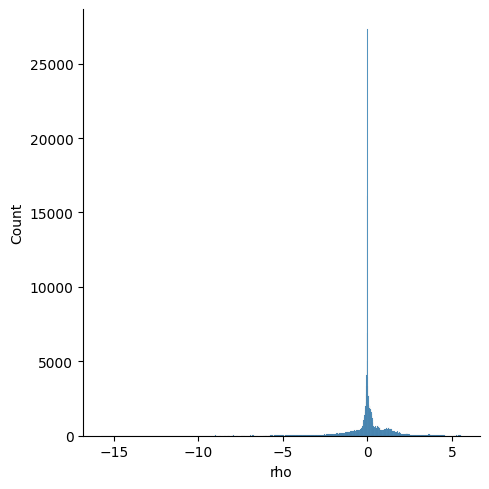

In [14]:
#distribution of our target variable
sns.displot(data=df, x="rho")

In [15]:
# droping it from the main dataset
df.drop(columns='rho',inplace=True) 

In [16]:
#detecting dtypes of each column
df.dtypes

date                   object
adjusted close        float64
option symbol          object
expiration             object
strike                float64
call/put               object
ask                   float64
bid                   float64
mean price            float64
iv                    float64
volume                  int64
open interest           int64
stock price for iv    float64
delta                 float64
vega                  float64
gamma                 float64
theta                 float64
dtype: object

## Numarical variable exploration

In [17]:
#include all numerical cols
df_num = df.select_dtypes(include=np.number).columns.tolist() # Selecting all the featues having numarical data type and then use tolist to convert into an ordinery list
df_num = df[df_num] # Converting them into a dataframe then
df_num.dtypes # printing the datatype of all the columns present in the df_num

adjusted close        float64
strike                float64
ask                   float64
bid                   float64
mean price            float64
iv                    float64
volume                  int64
open interest           int64
stock price for iv    float64
delta                 float64
vega                  float64
gamma                 float64
theta                 float64
dtype: object

In [18]:
# number of unique values in each column
for col in df_num.columns:   # Using for loop again to get column name one by one
    print(f' For \033[1m{col}\033[0m we have {len(df_num[col].unique())} values') # Printing each numarical feature with its unique values

 For adjusted close we have 21 values
 For strike we have 312 values
 For ask we have 22926 values
 For bid we have 22611 values
 For mean price we have 36172 values
 For iv we have 146910 values
 For volume we have 6205 values
 For open interest we have 14825 values
 For stock price for iv we have 21 values
 For delta we have 182814 values
 For vega we have 179397 values
 For gamma we have 28374 values
 For theta we have 91796 values


## Finding the correlation between variables

In [19]:
#pearson correlation
df_num.corr()  # Using .corr() function to find the pearson correlation of all the numarical variables

,adjusted close,strike,ask,bid,mean price,iv,volume,open interest,stock price for iv,delta,vega,gamma,theta
adjusted close,1.000000,0.016490,0.002918,0.002511,0.002721,-0.003073,-0.008051,0.008685,0.996243,0.017865,-0.001789,0.002520,0.030250
strike,0.016490,1.000000,-0.319156,-0.322220,-0.320711,-0.574573,0.023565,-0.058686,0.016942,-0.472470,0.128154,0.197369,-0.078016
ask,0.002918,-0.319156,1.000000,0.999817,0.999953,0.373107,-0.051920,-0.146613,0.002873,0.335986,-0.010311,-0.251779,0.234647
bid,0.002511,-0.322220,0.999817,1.000000,0.999954,0.376161,-0.051600,-0.145546,0.002505,0.339313,-0.019067,-0.250529,0.232326
mean price,0.002721,-0.320711,0.999953,0.999954,1.000000,0.374645,-0.051761,-0.146081,0.002695,0.337654,-0.014654,-0.251149,0.233473
iv,-0.003073,-0.574573,0.373107,0.376161,0.374645,1.000000,-0.126601,-0.001707,-0.004614,0.323266,-0.106163,-0.202550,0.068170
volume,-0.008051,0.023565,-0.051920,-0.051600,-0.051761,-0.126601,1.000000,0.185569,-0.008142,-0.012911,-0.049532,0.278318,-0.226557
open interest,0.008685,-0.058686,-0.146613,-0.145546,-0.146081,-0.001707,0.185569,1.000000,0.008777,-0.017046,-0.051157,0.082769,-0.120480
stock price for iv,0.996243,0.016942,0.002873,0.002505,0.002695,-0.004614,-0.008142,0.008777,1.000000,0.017548,-0.002040,0.002175,0.030413
delta,0.017865,-0.472470,0.335986,0.339313,0.337654,0.323266,-0.012911,-0.017046,0.017548,1.000000,-0.023021,-0.081819,-0.091948


<Axes: >

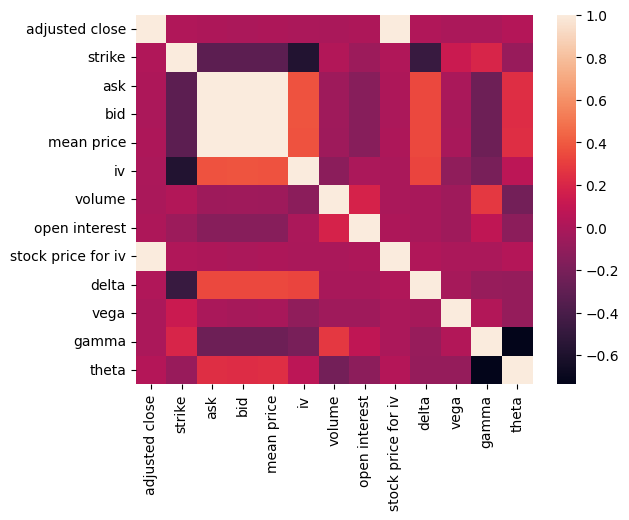

In [20]:
# heatmap
sns.heatmap(df_num.corr())  # visulizing the above correlation using heatmap using Seaborn library

1. ***Heatmap tells that 'ask','mean price' and 'bid' are very highly correlated so we can use any one of them.***

2. ***'Adjusted close' and 'stock price for iv' are highly correlated as well hence we can use any one of them.***

In [21]:
#dropping highly correalted columns
df_num.drop(['ask','mean price'],axis=1,inplace=True)
df_num.drop(['stock price for iv'],axis=1,inplace=True)

## Handeling Outliers for numarical variables

* Using Box plot

In [22]:
#making box plot for each numerical column to get better viz of outliers
for col in df_num.columns:  # Using for loop again to get column name one by one
    print(col)  # Printing the column name 
    fig = px.box(df, y=col)  # plotting the box plots using plotly library 
    fig.show()  # Showing the graphs using .show function

adjusted close


strike


bid


iv


volume


open interest


delta


vega


gamma


theta


In [23]:
#fucntion to detect percentage outliers from numerical features
def per_outlier_detector(data,col):
    # Calculating the Interquartile Range 
    Q1 = data[col].quantile(0.25)
    
    Q3 = data[col].quantile(0.75)
    
    IQR = Q3 - Q1   

    # Calculate the upper fence
    upper_fence = Q3 + 1.5 * IQR
    
    # Identify values above the upper fence
    outliers_above_upper_fence = data.loc[data[col] > upper_fence]
    
    # Count the number of values above the upper fence
    num_outliers_above_upper_fence = len(outliers_above_upper_fence)
    
    return (num_outliers_above_upper_fence/len(data))*100


In [24]:
for col in df_num.columns:
    print(f' Percentage of outlier for {col} is {per_outlier_detector(data=df_num,col=col)}')

 Percentage of outlier for adjusted close is 0.0
 Percentage of outlier for strike is 1.3988038688779711
 Percentage of outlier for bid is 9.766292988789663
 Percentage of outlier for iv is 5.647240845796802
 Percentage of outlier for volume is 19.03630918451363
 Percentage of outlier for open interest is 14.440433212996389
 Percentage of outlier for delta is 0.0
 Percentage of outlier for vega is 2.0307990192086716
 Percentage of outlier for gamma is 8.831193507233788
 Percentage of outlier for theta is 0.0


***1. So we get to know that columns like 'volume','open interest' and 'bid' are top3 numerical features having most values as Outlier ( if used Box Plot)***

## Applying Mean Tranformation to handle outliers

In [25]:

#replacing outlier by mean of that column
def replace_outliers_with_mean(df, column_name, mul_fac=1.5):
   

    # Calculate the IQR
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1

    # Define the lower and upper bounds for outliers
    lower_bound = Q1 - mul_fac * IQR
    upper_bound = Q3 + mul_fac * IQR

    # Identify outliers
    outliers = (df[column_name] < lower_bound) | (df[column_name] > upper_bound)

    # Replace outliers with the mean of the column
    mean_value = df[column_name].mean()
    df.loc[outliers, column_name] = mean_value

    return df


df_num = replace_outliers_with_mean(df_num,'volume')
df_num = replace_outliers_with_mean(df_num,'open interest')
df_num= replace_outliers_with_mean(df_num,'bid')
df_num = replace_outliers_with_mean(df_num,'gamma')
df_num = replace_outliers_with_mean(df_num,'vega')
df_num =replace_outliers_with_mean(df_num,'iv')
df_num = replace_outliers_with_mean(df_num,'strike')

In [26]:
# checking if %of outlier reduced
for col in df_num.columns:
    print(f' Percentage of outlier for {col} is {per_outlier_detector(data=df_num,col=col)}')

 Percentage of outlier for adjusted close is 0.0
 Percentage of outlier for strike is 1.1590347710431315
 Percentage of outlier for bid is 4.55108891361979
 Percentage of outlier for iv is 3.6024175963374137
 Percentage of outlier for volume is 19.03630918451363
 Percentage of outlier for open interest is 0.0
 Percentage of outlier for delta is 0.0
 Percentage of outlier for vega is 0.7419270197153534
 Percentage of outlier for gamma is 1.85391276023995
 Percentage of outlier for theta is 0.0


# New Feature creation

## Task two According to activity- 3 
***Engineer a new feature***

**Option Sensitivity Ratio (OSR)**. OSR combines the information from delta, gamma, theta, and vega into a single metric, providing a comprehensive view of an option's sensitivity to different market factors.

**OSR= (delta+vega+gamma+theta)/4**


In [27]:
# Creating a new feature according to the 'Engineer a new featues part' Option Sensitivity Ration (OSR) a new part of Data set

#  Applying lambda function and to (x1+x2+x3+x4)/4 (mean of all 4 columns, row wise)
df_num['OSR'] = df_num.apply(lambda x : (x['delta']+x['vega']+x['gamma']+x['theta'])/4,axis=1)

# Displaying the top 5 values of DataFrame df_num
df_num.head()

,adjusted close,strike,bid,iv,volume,open interest,delta,vega,gamma,theta,OSR
0,438.51,215.0,40.96742,0.234593,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,438.51,215.0,0.00000,0.234593,0.000000,1401.0,0.0,0.0,0.0,0.0,0.0
2,438.51,220.0,40.96742,0.234593,0.000000,1.0,0.0,0.0,0.0,0.0,0.0
3,438.51,220.0,0.00000,0.234593,405.715661,328.0,0.0,0.0,0.0,0.0,0.0
4,438.51,225.0,40.96742,0.234593,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
#showing buttom five values of DataFrame df_naum using pandas tail function
df_num.tail()

,adjusted close,strike,bid,iv,volume,open interest,delta,vega,gamma,theta,OSR
221041,430.43,398.702076,40.96742,0.148305,0.0,1.0,-0.924500,0.750370,0.001112,-0.011128,-0.046037
221042,430.43,398.702076,1.80000,0.148310,0.0,146.0,0.051628,0.710649,0.001053,-0.005507,0.189456
221043,430.43,398.702076,40.96742,0.148310,0.0,0.0,-0.928176,0.710649,0.001053,-0.010792,-0.056817
221044,430.43,398.702076,1.30000,0.148310,5.0,1.0,0.048170,0.672488,0.000997,-0.005217,0.179110
221045,430.43,398.702076,40.96742,0.148310,0.0,0.0,-0.931634,0.672488,0.000997,-0.010467,-0.067154


## Categorical features

In [29]:
#include all categorical cols
categorical_columns = df.select_dtypes(include=['object']).columns # Selecting all the featues having numarical data type

# Display the list of all categorical columns
print("Categorical Columns:")
print(categorical_columns)

Categorical Columns:
Index(['date', 'option symbol', 'expiration', 'call/put'], dtype='object')


In [30]:
#separating all categorical columns
df_cat = df[categorical_columns]

In [31]:
#no of unique vakues in each column
for col in df_cat:
    print(f'For {col} we have {len(df_cat[col].unique())}')

For date we have 21
For option symbol we have 13960
For expiration we have 48
For call/put we have 2


## Dropping ***date*** because in this problem statemnt we have to use 29 days of training data and last day as ***testing data***.

In [32]:
# printing complete categorical dataframe
df_cat

,date,option symbol,expiration,call/put
0,07/30/2021,SPY 210730C00215000,07/30/2021,C
1,07/30/2021,SPY 210730P00215000,07/30/2021,P
2,07/30/2021,SPY 210730C00220000,07/30/2021,C
3,07/30/2021,SPY 210730P00220000,07/30/2021,P
4,07/30/2021,SPY 210730C00225000,07/30/2021,C
...,...,...,...,...
221041,07/01/2021,SPY 231215P00630000,12/15/2023,P
221042,07/01/2021,SPY 231215C00635000,12/15/2023,C
221043,07/01/2021,SPY 231215P00635000,12/15/2023,P
221044,07/01/2021,SPY 231215C00640000,12/15/2023,C


### We are concatenating target column because **option symbol** has 13k unqiue values so can't choose One hot encoding because of high cardinality.

## Normalizing values using standard scaling and  one-hot encoding in below cells


* Concatenation

In [33]:
#concatenating atrget and cat df for target encoding
df_cat = pd.concat([df_y,df_cat],axis=1)  # Using .concat function to join the target variables and categorical features
df_cat

,rho,date,option symbol,expiration,call/put
0,0.000000,07/30/2021,SPY 210730C00215000,07/30/2021,C
1,0.000000,07/30/2021,SPY 210730P00215000,07/30/2021,P
2,0.000000,07/30/2021,SPY 210730C00220000,07/30/2021,C
3,0.000000,07/30/2021,SPY 210730P00220000,07/30/2021,P
4,0.000000,07/30/2021,SPY 210730C00225000,07/30/2021,C
...,...,...,...,...,...
221041,-14.857175,07/01/2021,SPY 231215P00630000,12/15/2023,P
221042,0.496773,07/01/2021,SPY 231215C00635000,12/15/2023,C
221043,-15.014119,07/01/2021,SPY 231215P00635000,12/15/2023,P
221044,0.463973,07/01/2021,SPY 231215C00640000,12/15/2023,C


* Targeting Encoding 

In [34]:
#target encoding option symbol column 
#we have not used one hot encoding because it had high cardinality

target_encoding = df_cat.groupby('option symbol')['rho'].mean() # For every 'option symbol' group we are calculating the mean 'rho'

# Creating new column with the help of  target encoding values that we get from 'option symbol'
df_cat['option symbol' + '_target_encode'] = df_cat['option symbol'].map(target_encoding)

# Displaying the Dataframe
df_cat

,rho,date,option symbol,expiration,call/put,option symbol_target_encode
0,0.000000,07/30/2021,SPY 210730C00215000,07/30/2021,C,0.079088
1,0.000000,07/30/2021,SPY 210730P00215000,07/30/2021,P,-0.000007
2,0.000000,07/30/2021,SPY 210730C00220000,07/30/2021,C,0.080922
3,0.000000,07/30/2021,SPY 210730P00220000,07/30/2021,P,-0.000012
4,0.000000,07/30/2021,SPY 210730C00225000,07/30/2021,C,0.082755
...,...,...,...,...,...,...
221041,-14.857175,07/01/2021,SPY 231215P00630000,12/15/2023,P,-14.810347
221042,0.496773,07/01/2021,SPY 231215C00635000,12/15/2023,C,0.491772
221043,-15.014119,07/01/2021,SPY 231215P00635000,12/15/2023,P,-14.949178
221044,0.463973,07/01/2021,SPY 231215C00640000,12/15/2023,C,0.457366


* OneHot Encoding

In [35]:
#one hot encoding

# For encoding we are using pandas .get_dummies on Call/Put Column
df_cat_dummy = pd.get_dummies(df_cat,columns=['call/put'], dtype=int)

# Disply the dataframe
df_cat_dummy

,rho,date,option symbol,expiration,option symbol_target_encode,call/put_C,call/put_P
0,0.000000,07/30/2021,SPY 210730C00215000,07/30/2021,0.079088,1,0
1,0.000000,07/30/2021,SPY 210730P00215000,07/30/2021,-0.000007,0,1
2,0.000000,07/30/2021,SPY 210730C00220000,07/30/2021,0.080922,1,0
3,0.000000,07/30/2021,SPY 210730P00220000,07/30/2021,-0.000012,0,1
4,0.000000,07/30/2021,SPY 210730C00225000,07/30/2021,0.082755,1,0
...,...,...,...,...,...,...,...
221041,-14.857175,07/01/2021,SPY 231215P00630000,12/15/2023,-14.810347,0,1
221042,0.496773,07/01/2021,SPY 231215C00635000,12/15/2023,0.491772,1,0
221043,-15.014119,07/01/2021,SPY 231215P00635000,12/15/2023,-14.949178,0,1
221044,0.463973,07/01/2021,SPY 231215C00640000,12/15/2023,0.457366,1,0


#### exctracting day of the week from date

In [36]:
#day of the week for expiration date
df_cat_dummy['day_of_week_expiration'] = pd.to_datetime(df_cat_dummy['expiration']).dt.day_name()

In [37]:
#one hot encoding

# Using the same encoding technique to 'day of week expiration' column
df_cat_dummy = pd.get_dummies(df_cat_dummy,columns=['day_of_week_expiration'], dtype=int)
df_cat_dummy

,rho,date,option symbol,expiration,option symbol_target_encode,call/put_C,call/put_P,day_of_week_expiration_Friday,day_of_week_expiration_Monday,day_of_week_expiration_Thursday,day_of_week_expiration_Tuesday,day_of_week_expiration_Wednesday
0,0.000000,07/30/2021,SPY 210730C00215000,07/30/2021,0.079088,1,0,1,0,0,0,0
1,0.000000,07/30/2021,SPY 210730P00215000,07/30/2021,-0.000007,0,1,1,0,0,0,0
2,0.000000,07/30/2021,SPY 210730C00220000,07/30/2021,0.080922,1,0,1,0,0,0,0
3,0.000000,07/30/2021,SPY 210730P00220000,07/30/2021,-0.000012,0,1,1,0,0,0,0
4,0.000000,07/30/2021,SPY 210730C00225000,07/30/2021,0.082755,1,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
221041,-14.857175,07/01/2021,SPY 231215P00630000,12/15/2023,-14.810347,0,1,1,0,0,0,0
221042,0.496773,07/01/2021,SPY 231215C00635000,12/15/2023,0.491772,1,0,1,0,0,0,0
221043,-15.014119,07/01/2021,SPY 231215P00635000,12/15/2023,-14.949178,0,1,1,0,0,0,0
221044,0.463973,07/01/2021,SPY 231215C00640000,12/15/2023,0.457366,1,0,1,0,0,0,0


### Using only useful columns

In [38]:
df_cat = df_cat_dummy[['option symbol_target_encode','call/put_C','call/put_P',
                      'day_of_week_expiration_Friday','day_of_week_expiration_Monday','day_of_week_expiration_Thursday','day_of_week_expiration_Tuesday',
                      'day_of_week_expiration_Wednesday','date']]
df_cat

,option symbol_target_encode,call/put_C,call/put_P,day_of_week_expiration_Friday,day_of_week_expiration_Monday,day_of_week_expiration_Thursday,day_of_week_expiration_Tuesday,day_of_week_expiration_Wednesday,date
0,0.079088,1,0,1,0,0,0,0,07/30/2021
1,-0.000007,0,1,1,0,0,0,0,07/30/2021
2,0.080922,1,0,1,0,0,0,0,07/30/2021
3,-0.000012,0,1,1,0,0,0,0,07/30/2021
4,0.082755,1,0,1,0,0,0,0,07/30/2021
...,...,...,...,...,...,...,...,...,...
221041,-14.810347,0,1,1,0,0,0,0,07/01/2021
221042,0.491772,1,0,1,0,0,0,0,07/01/2021
221043,-14.949178,0,1,1,0,0,0,0,07/01/2021
221044,0.457366,1,0,1,0,0,0,0,07/01/2021


## Concatenating Numerical and Categorical columns

In [39]:
#  Using .concat funtion again to concatenate our Independent Variables i.e numarical columns and Categorical column
df_complete_X= pd.concat([df_num,df_cat],axis=1)

#  Displaying the dataframe
df_complete_X

,adjusted close,strike,bid,iv,volume,open interest,delta,vega,gamma,theta,OSR,option symbol_target_encode,call/put_C,call/put_P,day_of_week_expiration_Friday,day_of_week_expiration_Monday,day_of_week_expiration_Thursday,day_of_week_expiration_Tuesday,day_of_week_expiration_Wednesday,date
0,438.51,215.000000,40.96742,0.234593,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.079088,1,0,1,0,0,0,0,07/30/2021
1,438.51,215.000000,0.00000,0.234593,0.000000,1401.0,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000007,0,1,1,0,0,0,0,07/30/2021
2,438.51,220.000000,40.96742,0.234593,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.080922,1,0,1,0,0,0,0,07/30/2021
3,438.51,220.000000,0.00000,0.234593,405.715661,328.0,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000012,0,1,1,0,0,0,0,07/30/2021
4,438.51,225.000000,40.96742,0.234593,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.082755,1,0,1,0,0,0,0,07/30/2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221041,430.43,398.702076,40.96742,0.148305,0.000000,1.0,-0.924500,0.750370,0.001112,-0.011128,-0.046037,-14.810347,0,1,1,0,0,0,0,07/01/2021
221042,430.43,398.702076,1.80000,0.148310,0.000000,146.0,0.051628,0.710649,0.001053,-0.005507,0.189456,0.491772,1,0,1,0,0,0,0,07/01/2021
221043,430.43,398.702076,40.96742,0.148310,0.000000,0.0,-0.928176,0.710649,0.001053,-0.010792,-0.056817,-14.949178,0,1,1,0,0,0,0,07/01/2021
221044,430.43,398.702076,1.30000,0.148310,5.000000,1.0,0.048170,0.672488,0.000997,-0.005217,0.179110,0.457366,1,0,1,0,0,0,0,07/01/2021


In [40]:
# Using .concat funtion again to concatenate date and target variables
df_complete_y= pd.concat([df_y,df['date']],axis=1)
df_complete_y

,rho,date
0,0.000000,07/30/2021
1,0.000000,07/30/2021
2,0.000000,07/30/2021
3,0.000000,07/30/2021
4,0.000000,07/30/2021
...,...,...
221041,-14.857175,07/01/2021
221042,0.496773,07/01/2021
221043,-15.014119,07/01/2021
221044,0.463973,07/01/2021


## Splitting the data into test and train subsets

In [41]:
# Converting date column into date and time data type in both the dataframes df_complete_X and df_complete_y
df_complete_X['date']=pd.to_datetime(df_complete_X['date'])
df_complete_y['date']=pd.to_datetime(df_complete_y['date'])

In [42]:
# Splitting the data into training data, As per of assignment we need to predict the rho for 30-07-2021
# So we are putting whole data till 29-07-2021 into training 

#  Using loc to save out data into train_X variable and we add a condition in it that value of date must
# be less than or equal to 2021-07-29
train_X = df_complete_X.loc[(df_complete_X['date']<='2021-07-29')]
# Now we are removing  date column from our training dataset using != (not equal)
train_X = train_X.loc[:, train_X.columns != 'date']

# Here again we are using loc to get the training traget variable
train_y = df_complete_y.loc[(df_complete_y['date']<='2021-07-29')]['rho']

## standard scaling
#### Task one According to activity- 3 
***scaling your dataset***.

In [43]:
#  Creating a variable to do standard scaler on our training and testing data of X featues

# Standardization is a scaling technique which makes the 
# data scale-free by converting the statistical distribution of the data

scaler = StandardScaler()

In [44]:
# Fitting train_X to StandardScaler using fit_transform function, 
# which fit and transform together for train X. 
# Fit is used to learn the scaling parameters of that data 
# It learn the mean, variance of the train dataset which we use in future ob test dataset
train_X = scaler.fit_transform(train_X.values)


## PCA and capturing features that explain 90% variance and above 

#### Task Three According to activity- 3 
***Use Dimension Reduction PCA to rank the importance of each feature and uses only the features that contribute to 90% of the information in the dataset.***.

In [45]:
# initialising PCA
from sklearn.decomposition import PCA
import math


## So we are capturing 90% variance of data

In [46]:
#  Creating an array in range of 14 from 0 to 13 [0,1,2,3,4,5,6,7,8,9,10,11,12,13]
nums = np.arange(14)

Text(0.5, 1.0, 'Num of components  vs. Explained Variance Ratio')

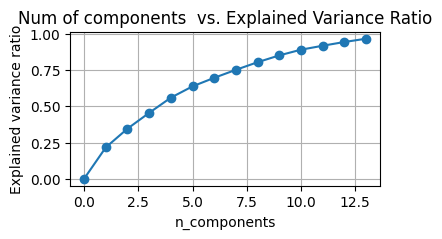

In [47]:
# Trying different values of n_components to get the best number of n_components

# Creating a list to save the ratio
var_ratio = []
for num in nums:
#     Using PCA function and trying diffent n_components
    pca = PCA(n_components=num)
#     Fitting the training data
    pca.fit(train_X)
#     appending in the list
    var_ratio.append(np.sum(pca.explained_variance_ratio_))

import matplotlib.pyplot as plt

plt.figure(figsize=(4,2),dpi=100)
plt.grid()
plt.plot(nums,var_ratio,marker='o')
plt.xlabel('n_components')
plt.ylabel('Explained variance ratio')
plt.title('Num of components  vs. Explained Variance Ratio')

# so we are selecting 11 as no of components (because it's a sweet spot)

In [48]:
# Applying n components 11 as it is our sweet spot
pca = PCA(n_components=11)

In [49]:
#applying pca to train dataset
train_X_pca = pca.fit_transform(train_X)

#using PCA features we are capturing 90%variance
print(sum(pca.explained_variance_ratio_))

0.9183481427092964


In [50]:
#  In this we are again using loc function to get test data but in this we are going to get data 
# where date is equal to '2021-07-30'
test_X = df_complete_X.loc[(df_complete_X['date']=='2021-07-30')]
# Removing date column from independent test data
test_X = test_X.loc[:, test_X.columns != 'date']

# Splitting test targeting variable using date colume 
test_y = df_complete_y.loc[(df_complete_y['date']=='2021-07-30')]['rho']

* Applying standard scaling on Test Dataset

In [51]:
#  Applying scaler transformation on our test dataset according to the fits that we got from train dataset
test_X = scaler.transform(test_X.values)


## applying PCA to test

In [52]:
#applying pca to test dataset
test_X_pca = pca.transform(test_X)
test_X_pca.shape

(10726, 11)

In [53]:
#  Displaying the shape all both test and train independent and dependent variable
test_X.shape,test_y.shape,train_X.shape,train_y.shape

((10726, 19), (10726,), (210320, 19), (210320,))

In [54]:
# Instantiation 
xgb_r = xg.XGBRegressor(objective ='reg:linear', 
                  n_estimators = 10, seed = 123) 
  
# Fitting the model 
xgb_r.fit(train_X_pca, train_y) 
  
# Predict the model 
pred = xgb_r.predict(test_X_pca) 
  
# MSE Computation 

mse = MSE(test_y, pred) 
print(f"MSE is {mse}")

MSE is 0.053085771163415466


# RESULTS
1. Using PCA our MSE is nearly the same becasue using the full dataset we got MSE **0.011** and now we got MSE of **0.053**.
2. We created a Extra feature which is **OSR** which is (delta+gamma+theta+vega)/4
3. we have used **Standard scaling** for our data.

## MSE (mean squared error)
MSE ranges from 0 to infinity
less the MSE better the model